## Dataset Information

The training archive contains 25,000 images of dogs and cats. Train your algorithm on these files and predict the labels

(1 = dog, 0 = cat).

## Download Dataset

In [1]:
!wget https://download.microsoft.com/download/3/e/1/3e1c3f21-ecdb-4869-8368-6deba77b919f/kagglecatsanddogs_5340.zip

--2025-03-12 02:59:11--  https://download.microsoft.com/download/3/e/1/3e1c3f21-ecdb-4869-8368-6deba77b919f/kagglecatsanddogs_5340.zip
Resolving download.microsoft.com (download.microsoft.com)... 184.25.248.114, 2600:1417:3f:58c::317f, 2600:1417:3f:580::317f, ...
Connecting to download.microsoft.com (download.microsoft.com)|184.25.248.114|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824887076 (787M) [application/octet-stream]
Saving to: ‘kagglecatsanddogs_5340.zip’

kagglecatsanddogs_5 100%[===================>] 786.67M   133MB/s    in 7.3s    

2025-03-12 02:59:18 (108 MB/s) - ‘kagglecatsanddogs_5340.zip’ saved [824887076/824887076]



## Unzip the Dataset

In [2]:
# !unzip kagglecatsanddogs_3367a.zip
!unzip kagglecatsanddogs_5340.zip

Streaming output truncated to the last 5000 lines.
  inflating: PetImages/Dog/5500.jpg  
  inflating: PetImages/Dog/5501.jpg  
  inflating: PetImages/Dog/5502.jpg  
  inflating: PetImages/Dog/5503.jpg  
  inflating: PetImages/Dog/5504.jpg  
  inflating: PetImages/Dog/5505.jpg  
  inflating: PetImages/Dog/5506.jpg  
  inflating: PetImages/Dog/5507.jpg  
  inflating: PetImages/Dog/5508.jpg  
  inflating: PetImages/Dog/5509.jpg  
  inflating: PetImages/Dog/551.jpg   
  inflating: PetImages/Dog/5510.jpg  
  inflating: PetImages/Dog/5511.jpg  
  inflating: PetImages/Dog/5512.jpg  
  inflating: PetImages/Dog/5513.jpg  
  inflating: PetImages/Dog/5514.jpg  
  inflating: PetImages/Dog/5515.jpg  
  inflating: PetImages/Dog/5516.jpg  
  inflating: PetImages/Dog/5517.jpg  
  inflating: PetImages/Dog/5518.jpg  
  inflating: PetImages/Dog/5519.jpg  
  inflating: PetImages/Dog/552.jpg   
  inflating: PetImages/Dog/5520.jpg  
  inflating: PetImages/Dog/5521.jpg  
  inflating: PetImages/Dog/5522.jpg  

## Import Modules

In [3]:
# Importing required libraries

import pandas as pd  # Pandas is used for data manipulation and creating DataFrames
import numpy as np  # NumPy is used for numerical computations and array operations
import matplotlib.pyplot as plt  # Matplotlib is used for data visualization (plotting graphs)

import warnings  # Warnings module to manage warning messages
import os  # OS module allows interaction with the operating system (e.g., file handling)
import tqdm  # tqdm is used for creating progress bars in loops
import random  # Random module is used to generate random numbers (e.g., selecting random images)

# Importing load_img from Keras for loading images
from keras.preprocessing.image import load_img  # Used to load images for processing in deep learning models

# Ignoring warnings to keep the output clean
warnings.filterwarnings('ignore')  # Suppresses warning messages to avoid clutter in the output


## Create Dataframe for Input and Output

In [4]:
# Initializing empty lists to store image file paths and corresponding labels
input_path = []  # List to store the file paths of images
label = []  # List to store labels (0 for Cat, 1 for Dog)

# Loop through each class folder (Cat and Dog) inside the "PetImages" directory
for class_name in os.listdir("PetImages"):
    # Loop through each file in the current class folder
    for path in os.listdir("PetImages/" + class_name):
        # Assign label 0 for Cat images and 1 for Dog images
        if class_name == 'Cat':
            label.append(0)  # Cat images get label 0
        else:
            label.append(1)  # Dog images get label 1

        # Append the full file path of the image to input_path
        input_path.append(os.path.join("PetImages", class_name, path))

# Print the first image file path and its corresponding label
print(input_path[0], label[0])


PetImages/Cat/8947.jpg 0


In [5]:
# Creating an empty DataFrame to store image file paths and their labels
df = pd.DataFrame()

# Assigning the 'images' column with file paths from input_path
df['images'] = input_path

# Assigning the 'label' column with corresponding class labels from label
df['label'] = label

# Shuffling the DataFrame randomly to mix the data
df = df.sample(frac=1).reset_index(drop=True)

# Displaying the first five rows of the DataFrame to verify correctness
df.head()


,images,label
0,PetImages/Cat/4350.jpg,0
1,PetImages/Cat/8304.jpg,0
2,PetImages/Cat/8043.jpg,0
3,PetImages/Dog/801.jpg,1
4,PetImages/Dog/9211.jpg,1


In [6]:
# Loop through each image file path in the 'images' column of the DataFrame
for i in df['images']:
    # Check if the file extension does not contain '.jpg'
    if '.jpg' not in i:
        # Print the file path if it is not a .jpg file
        print(i)


PetImages/Dog/Thumbs.db
PetImages/Cat/Thumbs.db


In [7]:
# Importing the PIL (Pillow) library for image processing
import PIL

# Initializing an empty list to store images that cannot be opened
l = []

# Loop through each image file path in the 'images' column of the DataFrame
for image in df['images']:
    try:
        # Try opening the image using PIL's Image module
        img = PIL.Image.open(image)
    except:
        # If an error occurs (file missing or corrupted), add the file path to the list
        l.append(image)

# Return the list of problematic images
l


['PetImages/Dog/Thumbs.db',
 'PetImages/Cat/666.jpg',
 'PetImages/Dog/11702.jpg',
 'PetImages/Cat/Thumbs.db']

In [8]:
# Removing unwanted database files and corrupted images from the DataFrame

# Remove 'Thumbs.db' file from the Dog images folder
df = df[df['images'] != 'PetImages/Dog/Thumbs.db']

# Remove 'Thumbs.db' file from the Cat images folder
df = df[df['images'] != 'PetImages/Cat/Thumbs.db']

# Remove a specific corrupted or unwanted image from the Cat folder
df = df[df['images'] != 'PetImages/Cat/666.jpg']

# Remove a specific corrupted or unwanted image from the Dog folder
df = df[df['images'] != 'PetImages/Dog/11702.jpg']

# Print the total number of remaining images in the dataset
len(df)


24998

## Exploratory Data Analysis

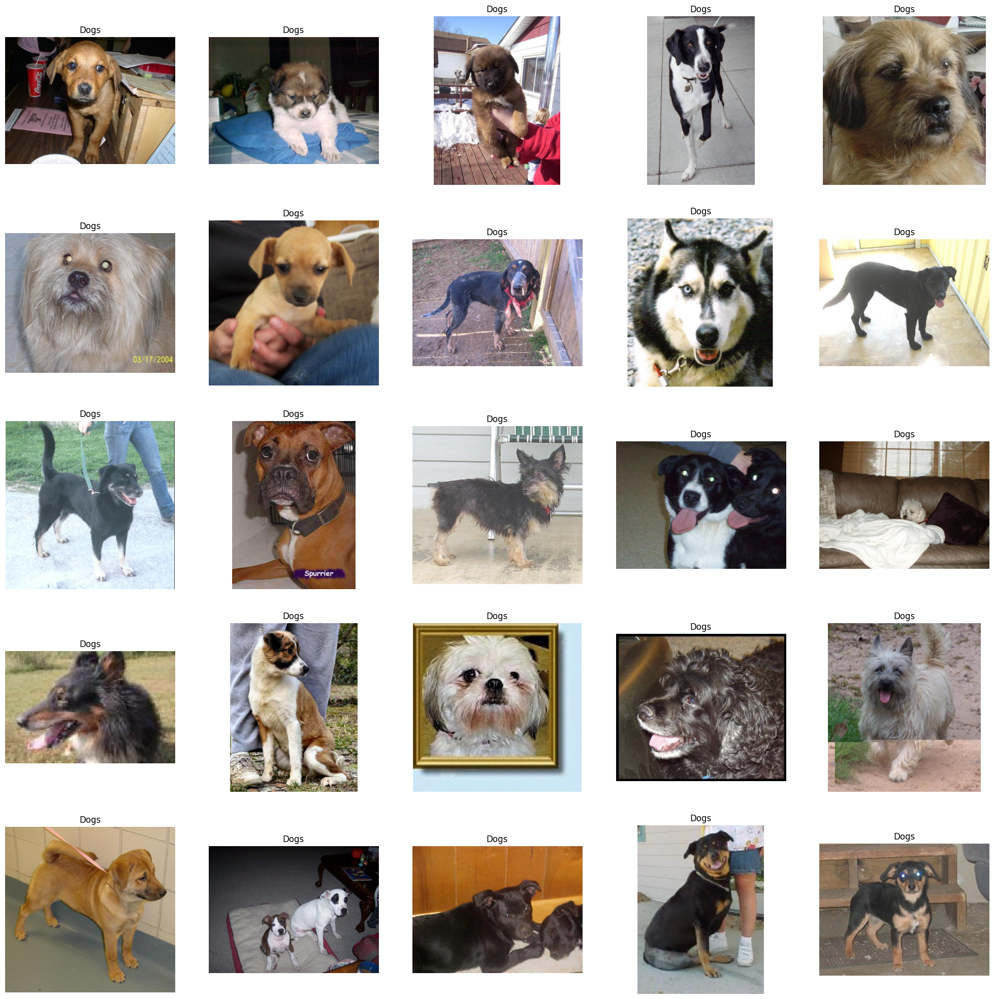

In [9]:
# Display a grid of 25 randomly selected dog images

# Create a figure with a large size to display images clearly
plt.figure(figsize=(25, 25))

# Filter the dataset to get only images labeled as dogs (label == 1)
temp = df[df['label'] == 1]['images']

# Select a random starting index to pick 25 images
start = random.randint(0, len(temp) - 25)  # Ensure the range is valid

# Select 25 consecutive image file paths from the randomly chosen starting index
files = temp[start:start + 25]

# Loop through the selected images and display them in a 5x5 grid
for index, file in enumerate(files):
    plt.subplot(5, 5, index + 1)  # Create a subplot for each image

    img = load_img(file)  # Load the image from the file path
    img = np.array(img)  # Convert the image to a NumPy array for visualization

    plt.imshow(img)  # Display the image
    plt.title('Dogs')  # Set the title as 'Dogs' for each image
    plt.axis('off')  # Hide axis lines for a cleaner view


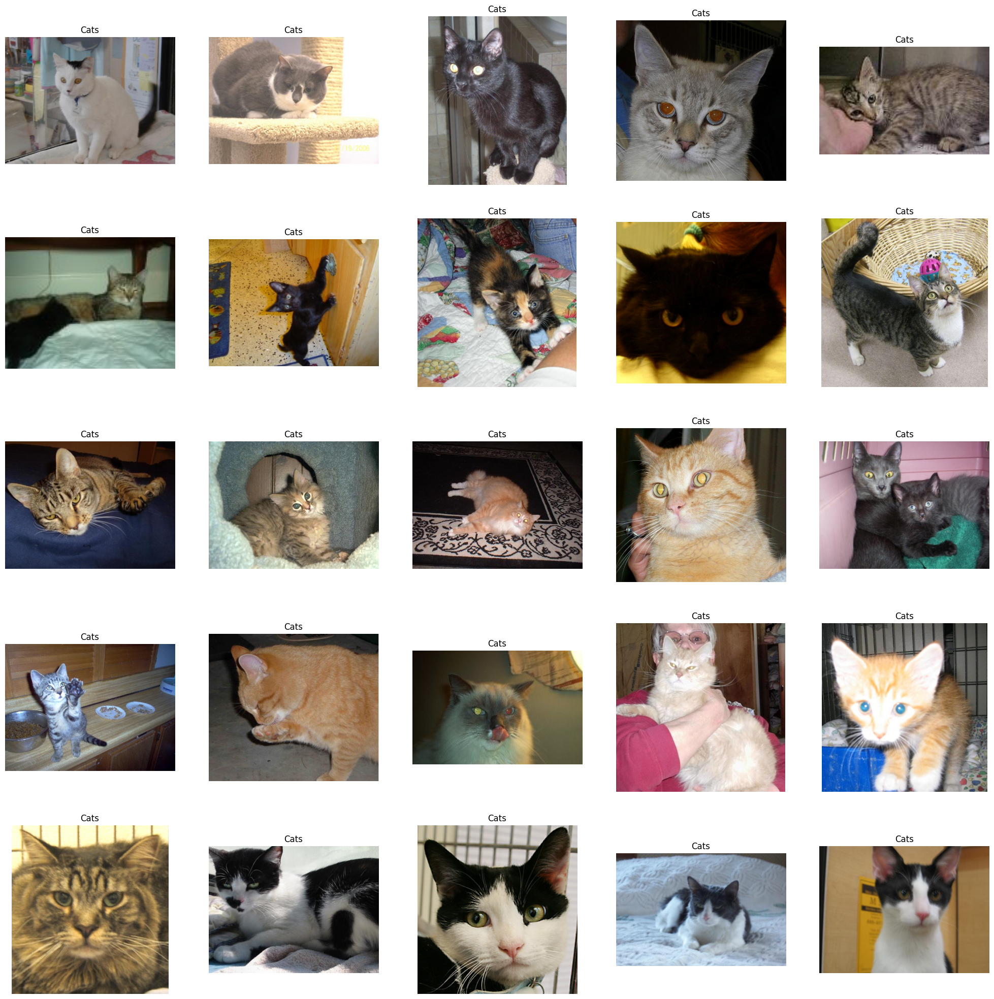

In [10]:
# Display a grid of 25 randomly selected cat images

# Create a figure with a large size to display images clearly
plt.figure(figsize=(25, 25))

# Filter the dataset to get only images labeled as cats (label == 0)
temp = df[df['label'] == 0]['images']

# Ensure there are at least 25 cat images to display
if len(temp) < 25:
    print("Not enough cat images available!")
else:
    # Select a random starting index to pick 25 images
    start = random.randint(0, len(temp) - 25)  # Ensures valid range

    # Select 25 consecutive image file paths from the randomly chosen starting index
    files = temp[start:start + 25].tolist()

    # Loop through the selected images and display them in a 5x5 grid
    for index, file in enumerate(files):
        plt.subplot(5, 5, index + 1)  # Create a subplot for each image

        img = load_img(file)  # Load the image from the file path
        img = np.array(img)  # Convert the image to a NumPy array for visualization

        plt.imshow(img)  # Display the image
        plt.title('Cats')  # Set the title as 'Cats' for each image
        plt.axis('off')  # Hide axis lines for a cleaner view


## Create DataGenerator for the Images

In [11]:
# Convert the 'label' column from integer type to string type
df['label'] = df['label'].astype('str')


In [12]:
df.head()

,images,label
0,PetImages/Cat/4350.jpg,0
1,PetImages/Cat/8304.jpg,0
2,PetImages/Cat/8043.jpg,0
3,PetImages/Dog/801.jpg,1
4,PetImages/Dog/9211.jpg,1


In [13]:
# Importing train_test_split from scikit-learn to split the dataset
from sklearn.model_selection import train_test_split

# Splitting the dataset into training (80%) and testing (20%) sets
train, test = train_test_split(df, test_size=0.2, random_state=42)


In [14]:
# Importing ImageDataGenerator for data augmentation and preprocessing
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Data augmentation for training images to improve model generalization
train_generator = ImageDataGenerator(
    rescale=1./255,        # Normalize pixel values to range (0, 1)
    rotation_range=40,     # Randomly rotate images up to 40 degrees
    shear_range=0.2,       # Apply shear transformations
    zoom_range=0.2,        # Randomly zoom into images
    horizontal_flip=True,  # Flip images horizontally
    fill_mode='nearest'    # Fill missing pixels after transformation
)

# Only rescale validation images (no augmentation needed, as we only evaluate)
val_generator = ImageDataGenerator(rescale=1./255)

# Creating training data iterator
train_iterator = train_generator.flow_from_dataframe(
    dataframe=train,        # Use the 'train' DataFrame
    x_col='images',         # Column containing image file paths
    y_col='label',          # Column containing class labels (0 = Cat, 1 = Dog)
    target_size=(128, 128), # Resize images to 128x128 pixels
    batch_size=32,          # Number of images per batch (adjust for memory efficiency)
    class_mode='binary'     # Binary classification (Cat vs. Dog)
)

# Creating validation data iterator
val_iterator = val_generator.flow_from_dataframe(
    dataframe=test,         # Use the 'test' DataFrame
    x_col='images',         # Column containing image file paths
    y_col='label',          # Column containing class labels
    target_size=(128, 128), # Resize images to 128x128 pixels
    batch_size=32,          # Number of images per batch
    class_mode='binary'     # Binary classification
)


Found 19998 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.


## Model Creation

In [15]:
# Import necessary layers from Keras
from keras import Sequential  # Import Sequential model type
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense  # Import essential layers

# Initialize a Sequential model (a stack of layers)
model = Sequential([
    # First convolutional layer with 16 filters, 3x3 kernel size, ReLU activation, and input shape (128x128x3)
    Conv2D(16, (3,3), activation='relu', input_shape=(128,128,3)),

    # First max pooling layer to reduce spatial dimensions
    MaxPool2D((2,2)),

    # Second convolutional layer with 32 filters, 3x3 kernel size, and ReLU activation
    Conv2D(32, (3,3), activation='relu'),

    # Second max pooling layer
    MaxPool2D((2,2)),

    # Third convolutional layer with 64 filters, 3x3 kernel size, and ReLU activation
    Conv2D(64, (3,3), activation='relu'),

    # Third max pooling layer
    MaxPool2D((2,2)),

    # Flatten the feature maps into a 1D array to feed into the fully connected layers
    Flatten(),

    # Fully connected (Dense) layer with 512 neurons and ReLU activation
    Dense(512, activation='relu'),

    # Output layer with a single neuron and sigmoid activation for binary classification (Cat vs Dog)
    Dense(1, activation='sigmoid')
])


In [16]:
# Compile the model with the chosen optimizer, loss function, and evaluation metric
model.compile(
    optimizer='adam',                # Adam optimizer for efficient learning rate adaptation
    loss='binary_crossentropy',      # Binary cross-entropy for binary classification (Cats vs. Dogs)
    metrics=['accuracy']             # Track accuracy as the evaluation metric
)

# Print the model summary to display the architecture
model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 126, 126, 16)        │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 63, 63, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 61, 61, 32)          │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 30, 30, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 28, 28, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 14, 14, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 12544)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │       6,423,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,447,137 (24.59 MB)

 Trainable params: 6,447,137 (24.59 MB)

 Non-trainable params: 0 (0.00 B)

In [17]:
# Train the CNN model using the training dataset and validate it on the test dataset
history = model.fit(
    train_iterator,   # Training dataset iterator
    epochs=10,        # Number of epochs (full passes over the dataset)
    validation_data=val_iterator  # Validation dataset iterator for performance monitoring
)


Epoch 1/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 132s 202ms/step - accuracy: 0.5824 - loss: 0.6830 - val_accuracy: 0.7156 - val_loss: 0.5625
Epoch 2/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 117s 188ms/step - accuracy: 0.7252 - loss: 0.5450 - val_accuracy: 0.7782 - val_loss: 0.4735
Epoch 3/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 119s 191ms/step - accuracy: 0.7636 - loss: 0.4912 - val_accuracy: 0.7554 - val_loss: 0.5046
Epoch 4/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 116s 186ms/step - accuracy: 0.7749 - loss: 0.4692 - val_accuracy: 0.8072 - val_loss: 0.4381
Epoch 5/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 118s 188ms/step - accuracy: 0.7881 - loss: 0.4478 - val_accuracy: 0.8132 - val_loss: 0.4112
Epoch 6/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 117s 187ms/step - accuracy: 0.8049 - loss: 0.4234 - val_accuracy: 0.8290 - val_loss: 0.3969
Epoch 7/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 120s 191ms/step - accuracy: 0.8147 - loss: 0.4021 - val_accuracy: 0.8406 - val_loss: 0.3669
Epoch 8/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 118s 189ms/step - accuracy: 0.8279 -

## Visualization of Results

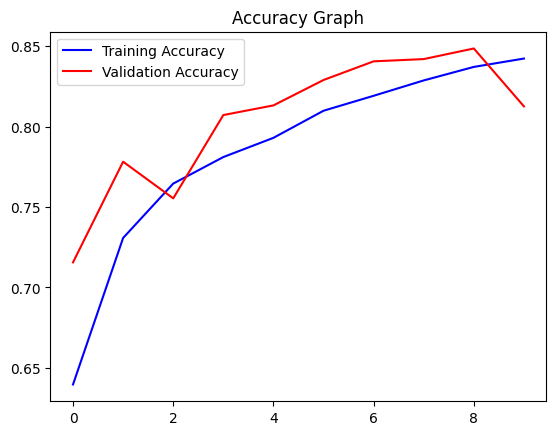

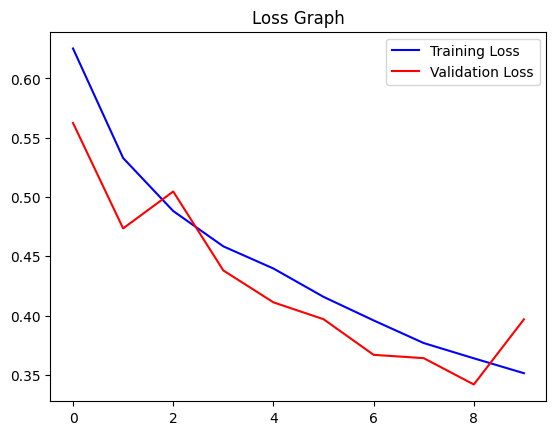

In [18]:
# Extract training and validation accuracy from the history object
acc = history.history['accuracy']  # Training accuracy per epoch
val_acc = history.history['val_accuracy']  # Validation accuracy per epoch

# Get the range of epochs (from 0 to total number of epochs)
epochs = range(len(acc))

# Plot the accuracy graph
plt.plot(epochs, acc, 'b', label='Training Accuracy')  # Blue line for training accuracy
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')  # Red line for validation accuracy
plt.title('Accuracy Graph')  # Set the title of the plot
plt.legend()  # Display the legend to differentiate training and validation curves
plt.figure()  # Create a new figure for the loss graph

# Extract training and validation loss from the history object
loss = history.history['loss']  # Training loss per epoch
val_loss = history.history['val_loss']  # Validation loss per epoch

# Plot the loss graph
plt.plot(epochs, loss, 'b', label='Training Loss')  # Blue line for training loss
plt.plot(epochs, val_loss, 'r', label='Validation Loss')  # Red line for validation loss
plt.title('Loss Graph')  # Set the title of the plot
plt.legend()  # Display the legend to differentiate training and validation curves
plt.show()  # Show the plots


## Test with Real Image

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 570ms/step
Cat 🐱


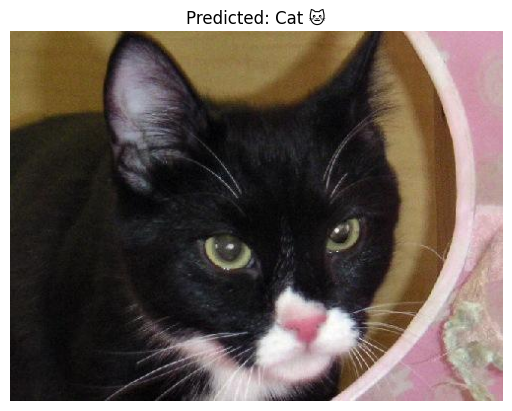

In [19]:
image_path = "/content/PetImages/Cat/10001.jpg"  # Path of the image

# Load and preprocess the image
img = load_img(image_path, target_size=(128, 128))
img_array = np.array(img) / 255.0  # Normalize the image
img_array = img_array.reshape(1, 128, 128, 3)  # Reshape for prediction

# Make a prediction
pred = model.predict(img_array)

# Determine the label
label = "Dog 🐶" if pred[0] > 0.5 else "Cat 🐱"
print(label)  # Print the label

# ✅ Display the image with the predicted label
plt.imshow(load_img(image_path))
plt.title(f"Predicted: {label}")
plt.axis("off")  # Hide axis
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Dog 🐶


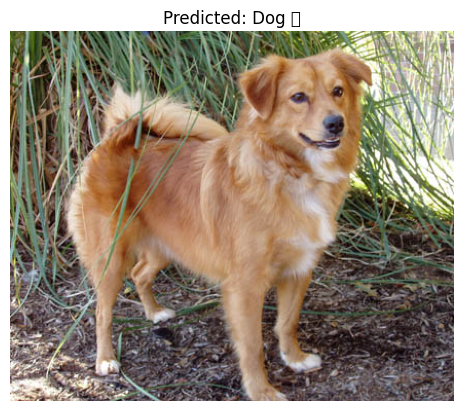

In [20]:
image_path = "/content/PetImages/Dog/10003.jpg"  # Path of the image

# Load and preprocess the image
img = load_img(image_path, target_size=(128, 128))
img_array = np.array(img) / 255.0  # Normalize the image
img_array = img_array.reshape(1, 128, 128, 3)  # Reshape for prediction

# Make a prediction
pred = model.predict(img_array)

# Determine the label
label = "Dog 🐶" if pred[0] > 0.5 else "Cat 🐱"
print(label)  # Print the label

# ✅ Display the image with the predicted label
plt.imshow(load_img(image_path))
plt.title(f"Predicted: {label}")
plt.axis("off")  # Hide axis
plt.show()
